In [1]:
from preprocess import Parser
from classifier import DiscriminativeClassifier, BinaryGenerativeClassifier
import pandas as pd
from io import StringIO
from nltk.collocations import BigramCollocationFinder, TrigramCollocationFinder
from nltk import word_tokenize
import nltk
import re
import operator
from topicmodel import LDA
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegressionCV
from sklearn.metrics import roc_auc_score, accuracy_score, confusion_matrix
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.dates as mdates


from wordcloud import WordCloud, STOPWORDS

In [2]:
data = pd.read_table(StringIO(''.join(l.replace('\u2028', ' ') for l in open('minutes_data.txt'))),
                    parse_dates=['meeting'])
data.head()

,meeting,text,seq,D_NBER
0,197601,"By unanimous vote, the Federal Reserve Bank o...",0,0
1,197601,"Committee, to execute transactions in the Sys...",1,0
2,197601,The information reviewed at this meeting sugg...,2,0
3,197601,"sales rose sharply, but the increase in the f...",3,0
4,197601,The exchange value of the dollar against lead...,4,0


In [3]:
grouped_data = data.groupby('meeting', as_index=False)
full_minutes = pd.concat([grouped_data['text'].apply(' '.join), grouped_data.first()], axis=1)
full_minutes.drop(['text', 'seq'], axis=1, inplace=True)
full_minutes.rename(columns={0: 'text'}, inplace=True)
# full_minutes.head()

In [4]:
parser = Parser(lemmatise=False, stem=True, replace_ngrams=True)
docs, vocab = parser.parse_vocab(data['text'])
corpus = parser.parse_corpus(docs, vocab)

Successfully parsed the corpus. # docs:  7659
Vocabulary size, # tokens:  4240


In [15]:
rec = pd.read_csv('recessions.csv', parse_dates=['Peak', 'Trough'])[1:]
rec.head()

,Peak,Trough
1,1980-01-01,1980-07-01
2,1981-07-01,1982-11-01
3,1990-07-01,1991-03-01
4,2001-03-01,2001-11-01
5,2007-12-01,2009-06-01


# Recessions

In [6]:
recessions = full_minutes[full_minutes['D_NBER'] == 1]
growths = full_minutes[full_minutes['D_NBER'] == 0]

In [7]:
r_docs, _ = parser.parse_vocab(recessions['text'])
recession_corpus = parser.parse_corpus(r_docs, vocab)

g_docs, _ = parser.parse_vocab(growths['text'])
growth_corpus = parser.parse_corpus(g_docs, vocab)

Successfully parsed the corpus. # docs:  39
Vocabulary size, # tokens:  4240
Successfully parsed the corpus. # docs:  283
Vocabulary size, # tokens:  4240


In [8]:
topic_model_recession = LDA(K=50, alpha=1, eta=0.01, optimize_hyperparam=True)
topic_model_growth = LDA(K=50, alpha=1, eta=0.01, optimize_hyperparam=True)

In [9]:
theta_recession, beta_recession, elbo_recession = topic_model_recession.fit(recession_corpus, vocab, 
                                                                            max_iter=5000, verbose=False)

Learning completed!
Total time taken: 72s
ELBO = -329890.366322


In [10]:
theta_growth, beta_growth, elbo_growth = topic_model_growth.fit(growth_corpus, vocab, 
                                                                max_iter=5000, verbose=False)

Learning completed!
Total time taken: 1532s
ELBO = -2540782.163924


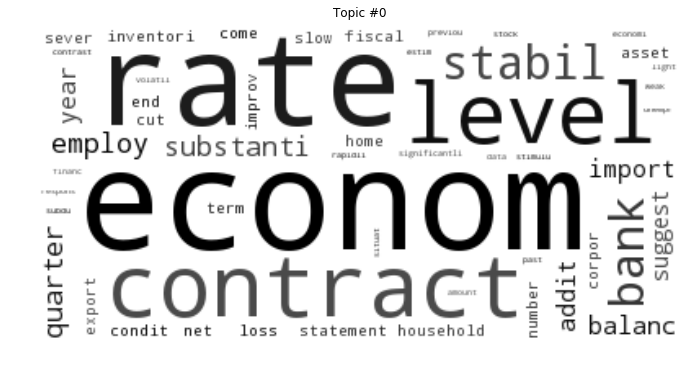

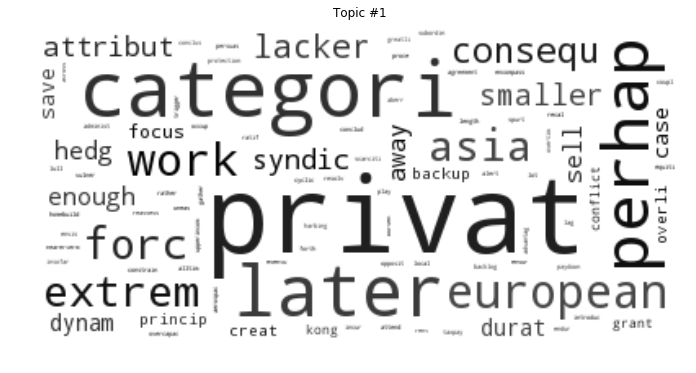

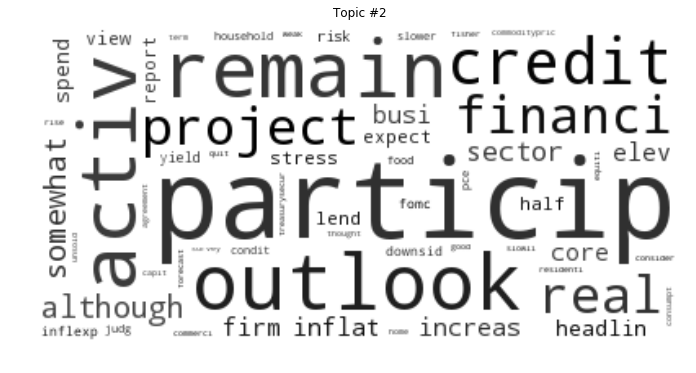

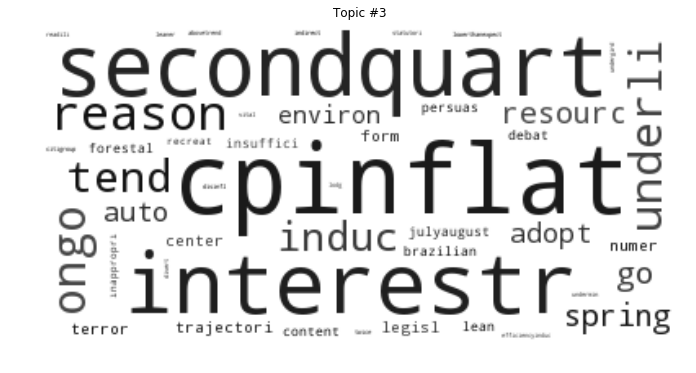

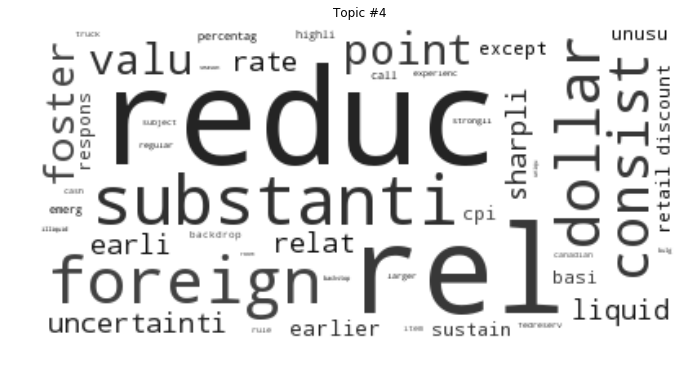

...

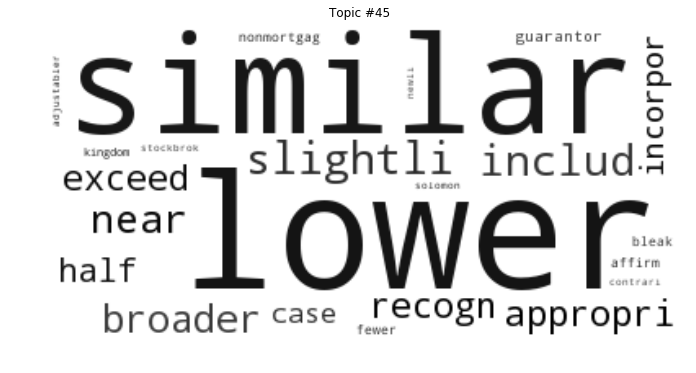

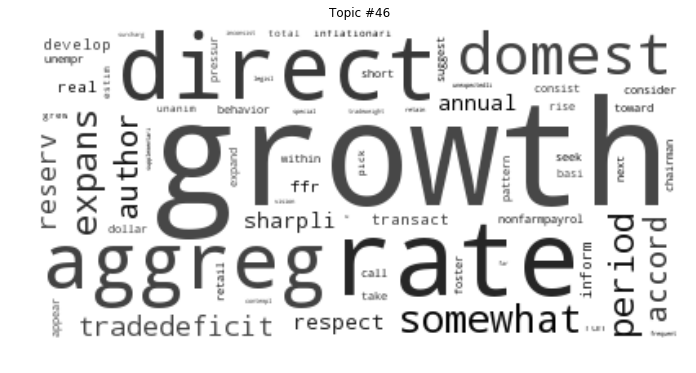

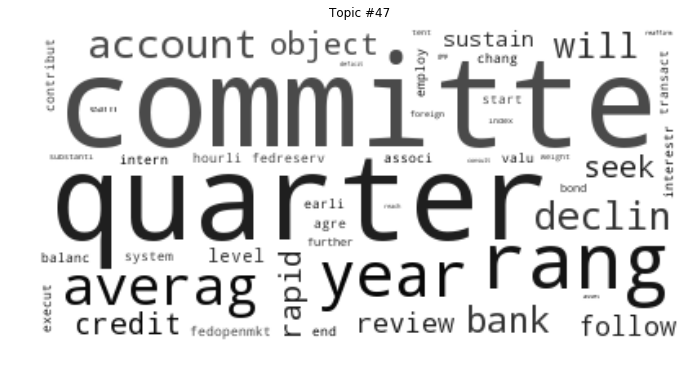

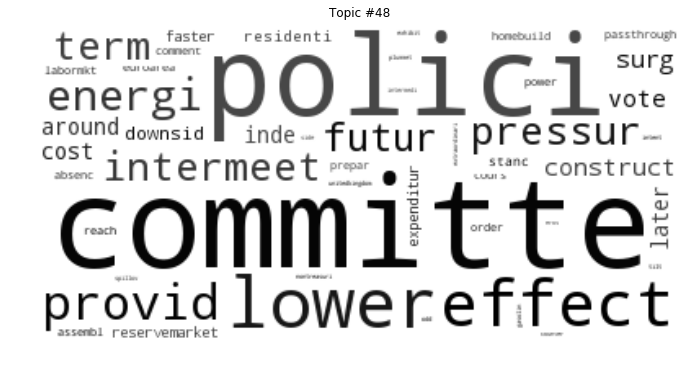

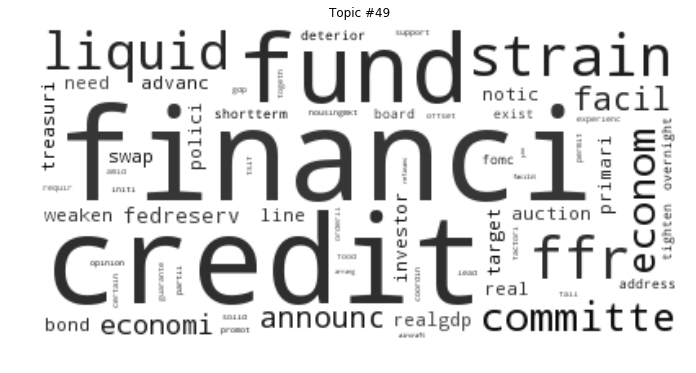

In [25]:
n_top_words = 200
topics = []
for i, topic_dist in enumerate(beta_recession):
    topic_words = np.argsort(topic_dist)[:-(n_top_words+1):-1]
    top_words = {}
    for j in topic_words:
        top_words[topic_model_recession._vocab[j]] = topic_dist[j]
        
    topics.append(top_words)
    # print('Topic {}: {}'.format(i, ' '.join(top_words)))

def grey_color_func(word, font_size, position, orientation, random_state=None,
                    **kwargs):
    return "hsl(0, 0%%, %d%%)" % np.random.randint(0, 30)

for t in range(topic_model_recession.num_topics):
    fig, ax = plt.subplots(figsize=(18, 6))
    ax.imshow(WordCloud(background_color="white", margin=10).fit_words(topics[t]).recolor(color_func=grey_color_func, random_state=3),
              interpolation="bilinear")
    plt.axis("off")
    plt.title("Topic #" + str(t))
    name = 'topic ' + str(t) + '.png'
    plt.savefig(name, format='png', dpi=200, transparent=True)
    plt.show()

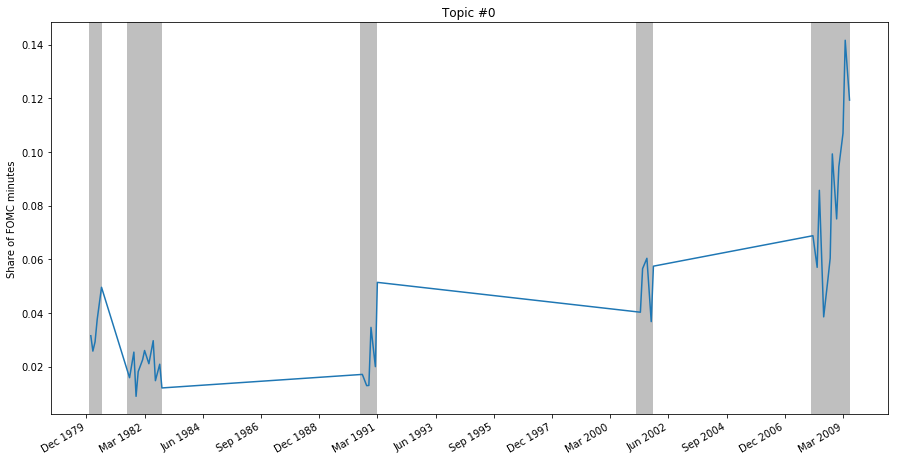

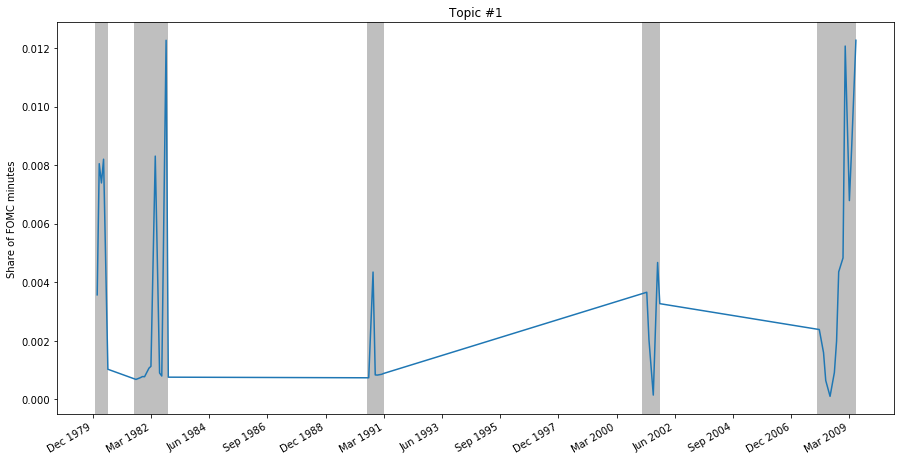

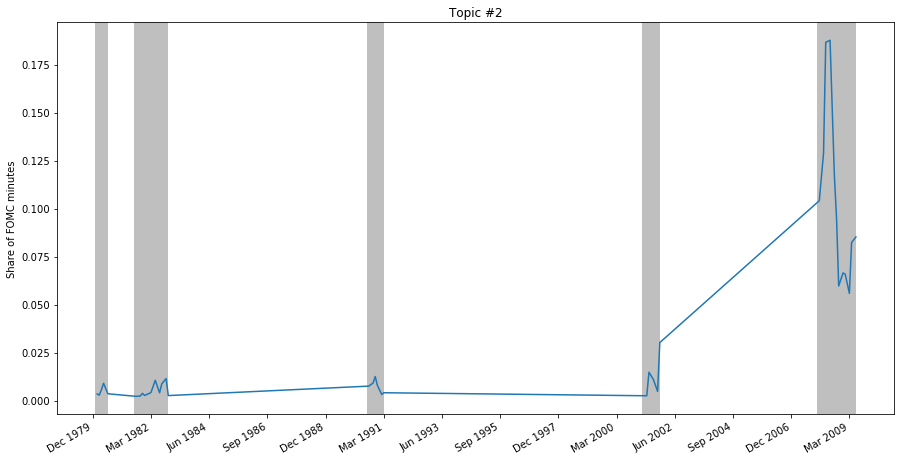

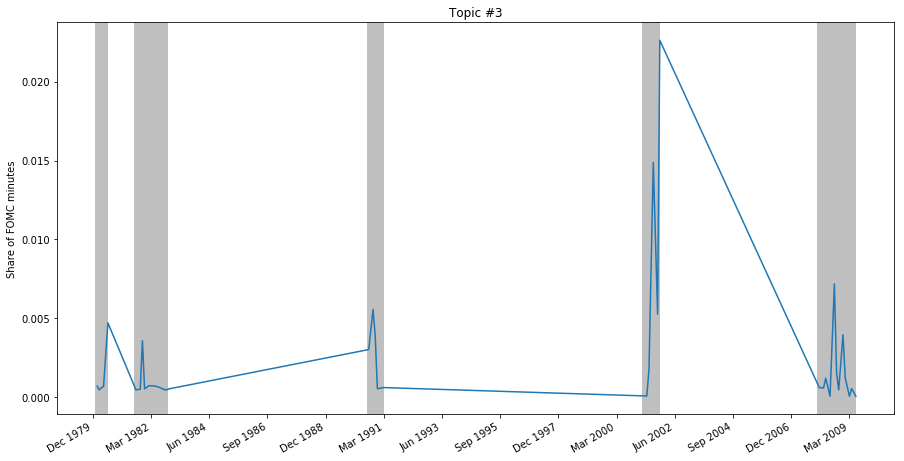

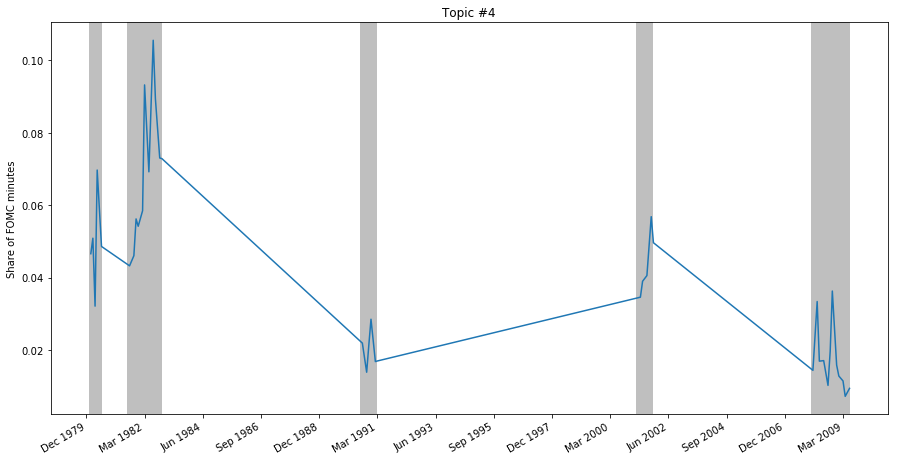

...

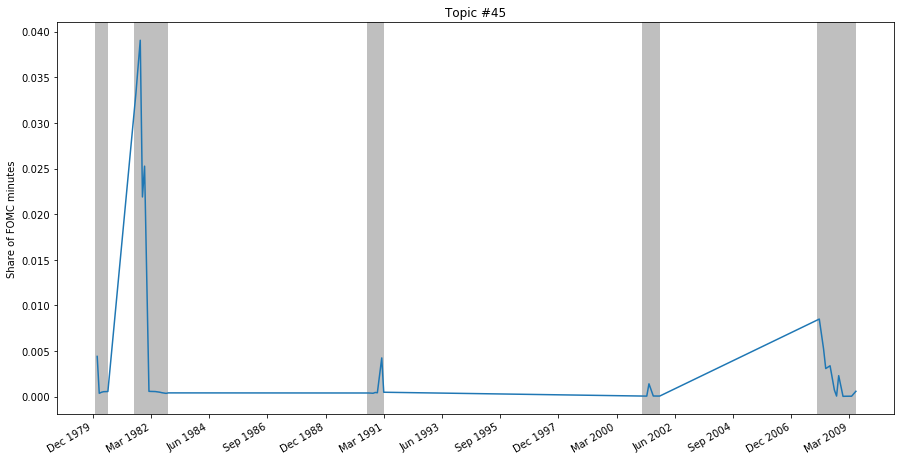

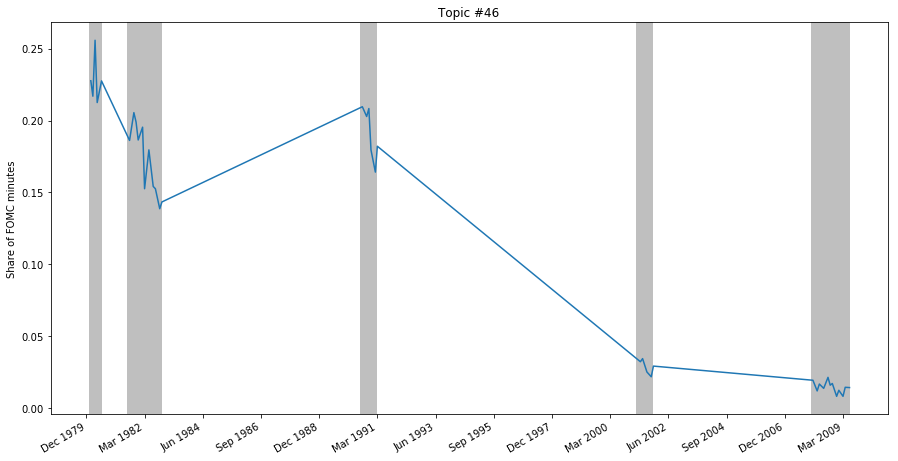

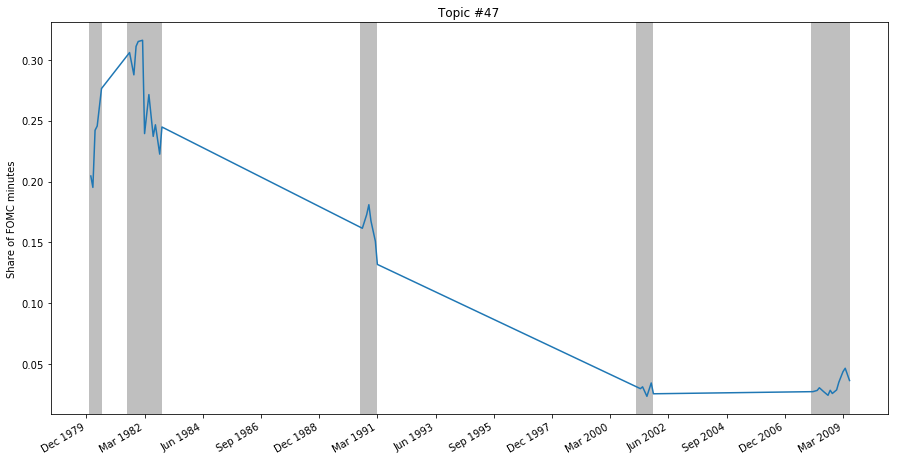

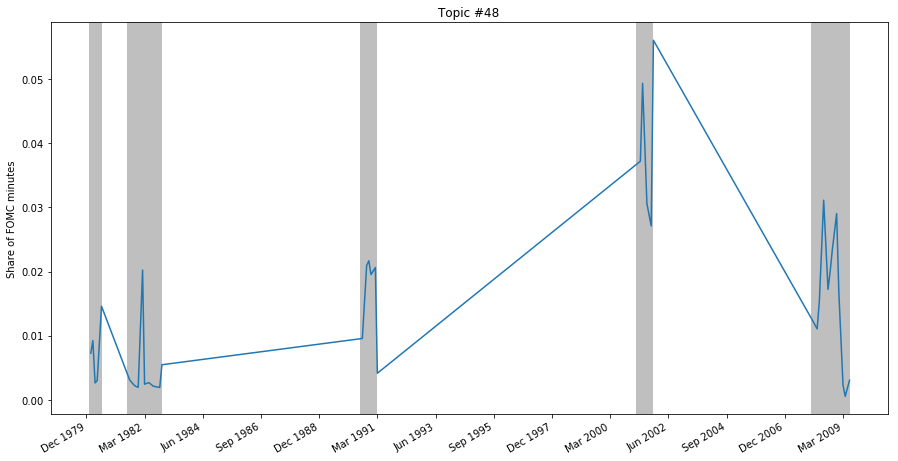

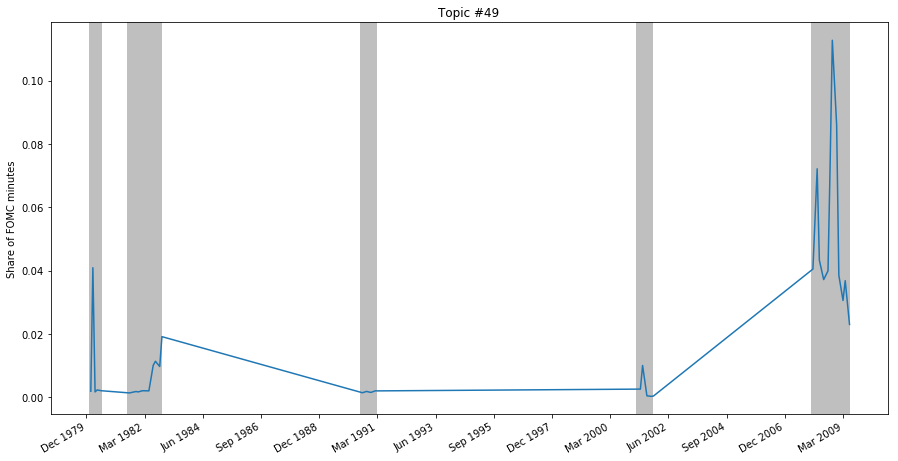

In [23]:
for k in range(topic_model_recession.num_topics):
    fig, ax = plt.subplots(1, figsize=(15,8))
    for idx, row in rec.iterrows():
        ax.axvspan(row['Peak'], row['Trough'], color='gray', alpha=0.5, lw=0)
    fig.autofmt_xdate()
    
    plt.plot(pd.to_datetime(recessions['meeting'], format='%Y%m'), theta_recession[:, k])

    xfmt = mdates.DateFormatter('%b %Y')
    ax.xaxis.set_major_formatter(xfmt)
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=27))
    plt.title("Topic #" + str(k))
    plt.ylabel('Share of FOMC minutes')
    name = 'plot topic ' + str(k) + '.png'
    plt.savefig(name, format='png', dpi=200, transparent=True)
    plt.show()

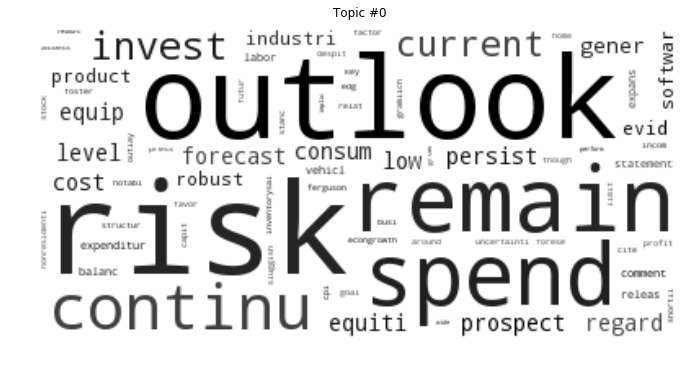

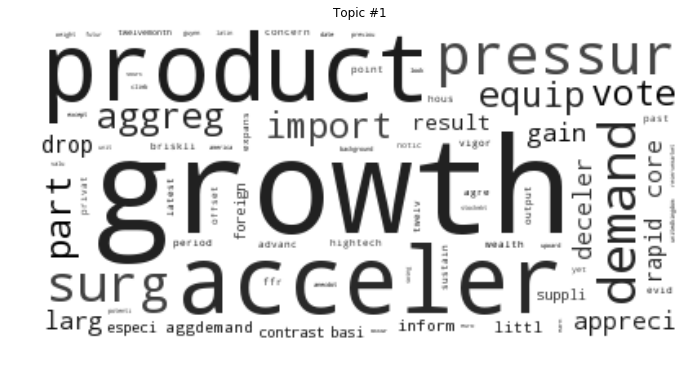

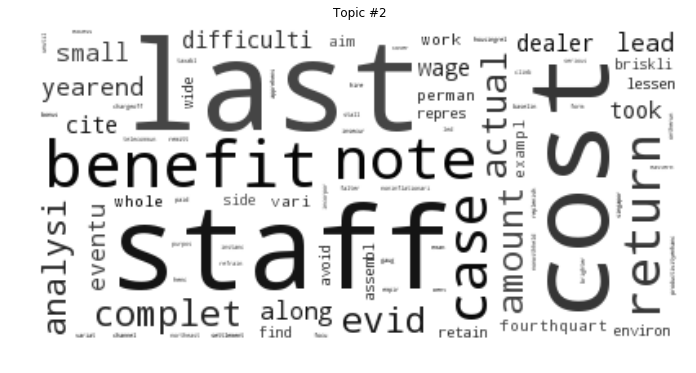

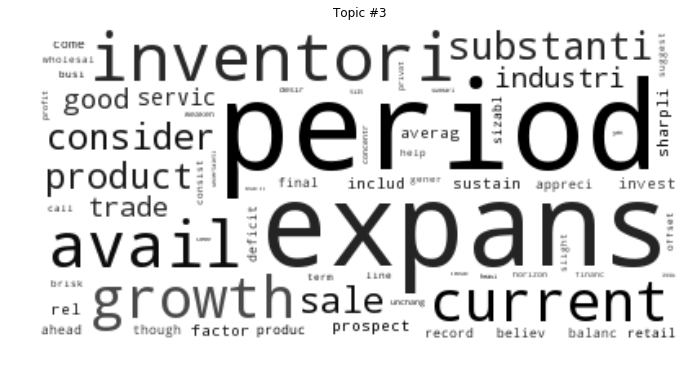

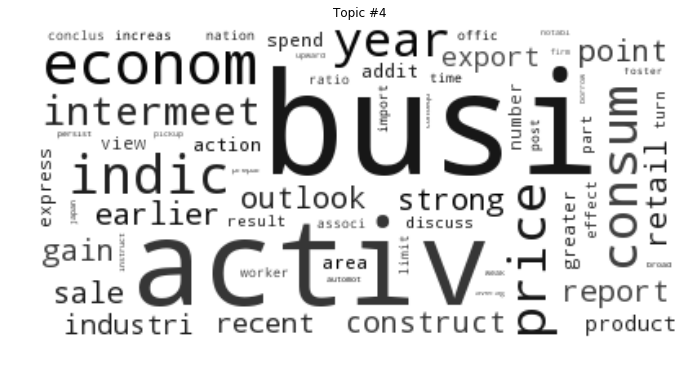

...

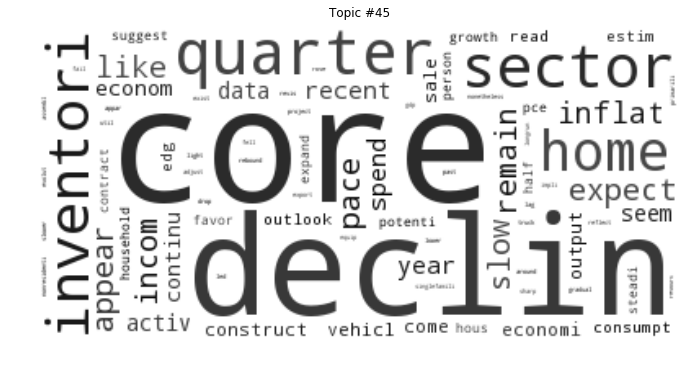

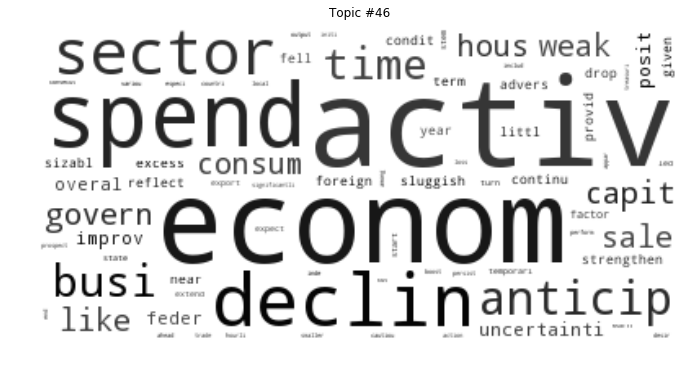

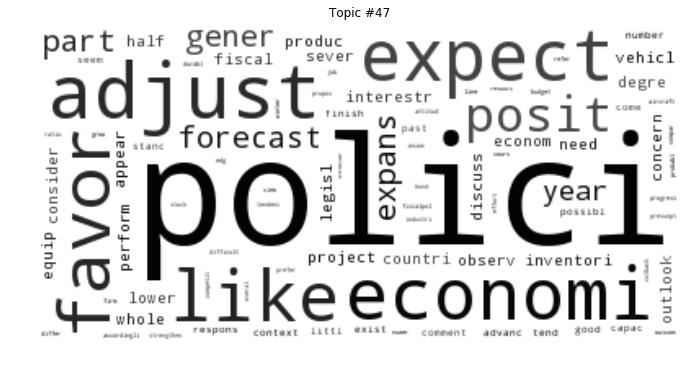

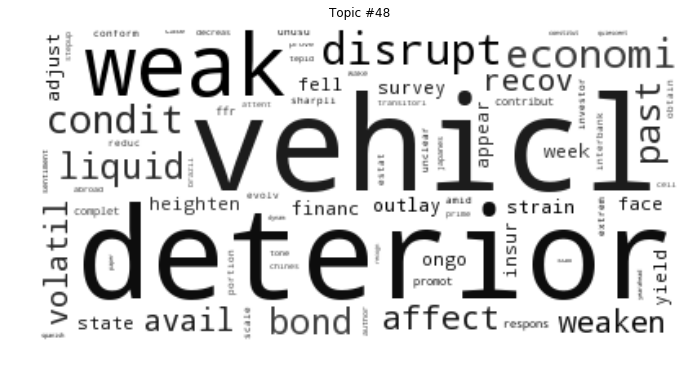

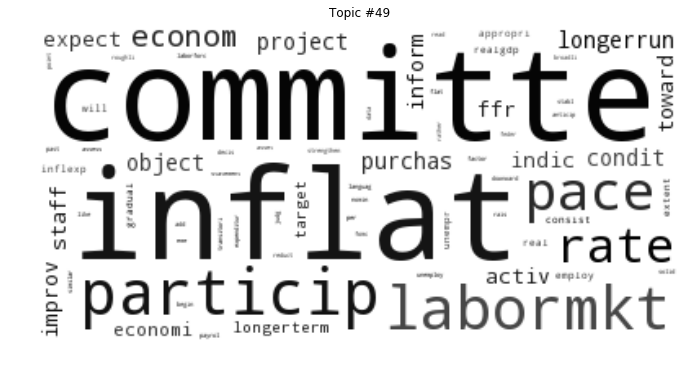

In [26]:
n_top_words = 200
topics = []
for i, topic_dist in enumerate(beta_growth):
    topic_words = np.argsort(topic_dist)[:-(n_top_words+1):-1]
    top_words = {}
    for j in topic_words:
        top_words[topic_model_growth._vocab[j]] = topic_dist[j]
        
    topics.append(top_words)
    # print('Topic {}: {}'.format(i, ' '.join(top_words)))

def grey_color_func(word, font_size, position, orientation, random_state=None,
                    **kwargs):
    return "hsl(0, 0%%, %d%%)" % np.random.randint(0, 30)

for t in range(topic_model_growth.num_topics):
    fig, ax = plt.subplots(figsize=(18, 6))
    ax.imshow(WordCloud(background_color="white", margin=10).fit_words(topics[t]).recolor(color_func=grey_color_func, random_state=3),
              interpolation="bilinear")
    plt.axis("off")
    plt.title("Topic #" + str(t))
    name = 'topic ' + str(t) + '.png'
    plt.savefig(name, format='png', dpi=200, transparent=True)
    plt.show()

In [27]:
topic_model_recession.alpha

array([ 1.60174062,  0.26375675,  0.75200785,  0.18214156,  1.47453265,
        0.46312999,  0.143993  ,  0.18512122,  0.5606791 ,  0.22744717,
        0.24402642,  0.17593207,  0.25384334,  0.1697735 ,  0.90772812,
        0.24743026,  0.51008177,  0.24833105,  0.74347464,  0.28302778,
        0.48841991,  0.21084101,  0.26590837,  0.38103079,  1.54208646,
        0.40739718,  0.23504517,  0.62690827,  0.24213711,  1.06684561,
        0.59007743,  0.57829145,  0.26775942,  0.57879257,  0.34971481,
        2.47622749,  0.18521708,  0.64438914,  3.01866239,  0.76736072,
        0.54608188,  0.22193179,  0.16751011,  0.22027324,  0.18585509,
        0.14536711,  2.63979848,  3.56845584,  0.5872148 ,  0.4621534 ])

In [37]:
for x in topic_model_recession.alpha:
    print(x)

1.60174062332
0.263756751113
0.752007847613
0.182141562916
1.47453264941
0.463129993657
0.143993001649
0.185121216863
0.560679101259
0.227447168755
0.244026421568
0.175932074809
0.253843339932
0.16977349801
0.907728119462
0.247430263592
0.51008176736
0.248331047424
0.743474638603
0.283027780053
0.488419907226
0.21084101145
0.265908367887
0.381030791245
1.54208646107
0.407397178841
0.235045168302
0.62690827262
0.242137111035
1.06684560634
0.590077432543
0.57829145119
0.267759420083
0.578792569015
0.349714808624
2.47622748621
0.185217082074
0.644389140309
3.01866238535
0.767360722418
0.546081875934
0.221931788213
0.167510109812
0.220273242946
0.185855088477
0.14536710737
2.63979847933
3.56845584137
0.587214803791
0.462153403185


In [29]:
topic_model_growth.alpha.argsort()

array([10, 39, 28, 33, 30, 27, 49,  2, 19, 35, 22, 41, 42,  5,  6, 44, 23,
       24, 26, 37, 16, 48, 32,  8, 13, 18, 15, 34,  7,  0, 31, 45, 11, 29,
       47, 43, 17, 25,  1, 46,  9, 36, 40,  4, 12,  3, 20, 14, 21, 38])

In [30]:
topic_model_recession.alpha.argsort()

array([ 6, 45, 42, 13, 11,  3,  7, 36, 44, 21, 43, 41,  9, 26, 28, 10, 15,
       17, 12,  1, 22, 32, 19, 34, 23, 25, 49,  5, 20, 16, 40,  8, 31, 33,
       48, 30, 27, 37, 18,  2, 39, 14, 29,  4, 24,  0, 35, 46, 38, 47])

In [31]:
topic_model_recession.alpha.sum()

33.305952981635919

In [32]:
topic_model_growth.alpha.sum()

26.712423581906531

In [34]:
n_top_words = 10
for i, topic_dist in enumerate(beta_growth):
    topic_words = np.argsort(topic_dist)[:-(n_top_words+1):-1]
    top_words = []
    for j in topic_words:
        top_words.append(topic_model_growth._vocab[j])
    print('Topic#{}: {}'.format(i+1, ' '.join(top_words)))

Topic#1: risk outlook remain spend continu invest current prospect equip consum
Topic#2: growth product acceler pressur demand surg aggreg import equip vote
Topic#3: last staff cost benefit note case return complet evid amount
Topic#4: period expans inventori avail growth current substanti consider product sale
Topic#5: busi activ econom indic consum price year intermeet earlier construct
Topic#6: credit bank loan remain continu declin financi condit spread econom
Topic#7: effect longerterm despit payment feder respond describ date offici outpac
Topic#8: order point polici regard shipment use vote assess edg thirdquart
Topic#9: inflat risk reduc view econgrowth home contact extent level fall
Topic#10: demand rise economi effect level direct dollar larg econom extent
Topic#11: domest ffr countri like equiti asia financi tight asian labor
Topic#12: foreign averag index industri increas servic larg product food save
Topic#13: growth committe total domest aggreg behavior rang reserv establ

In [38]:
n_top_words = 11
for i, topic_dist in enumerate(beta_recession):
    topic_words = np.argsort(topic_dist)[:-(n_top_words+1):-1]
    top_words = []
    for j in topic_words:
        top_words.append(topic_model_recession._vocab[j])
    print('Topic#{}: {}'.format(i+1, ' '.join(top_words)))

Topic#1: econom rate contract level stabil bank employ substanti quarter year addit
Topic#2: privat categori later perhap european work extrem asia forc consequ lacker
Topic#3: particip remain activ outlook credit project real financi although somewhat sector
Topic#4: cpinflat secondquart interestr reason ongo underli tend induc resourc go spring
Topic#5: reduc rel substanti foreign dollar consist point valu foster uncertainti sharpli
Topic#6: intermeet like drop institut expect issuanc signific emerg paper equip gener
Topic#7: purchas billion recoveri equiti desk decreas sector extend bond unemploy debt
Topic#8: interbank widen decis observ natur unlik thu achiev broadli conserv eci
Topic#9: depress expect low posit context adjust vehicl sizabl place summer capac
Topic#10: issu steadi sentiment depreci recov restrict commod steepen haircut reuters/univers offer
Topic#11: public longer prefer recess extens peak alreadi forward adopt readi prolong
Topic#12: process confid accommod recov

# Plotting

In [39]:
growth_words = pd.read_csv('growth_words.csv')
beta_sort_growth = np.sort(beta_growth)[:, ::-1]

In [41]:
recession_words = pd.read_csv('recession_words.csv')
beta_sort_recession = np.sort(beta_recession)[:, ::-1]

In [44]:
to_plot_growth = pd.concat([pd.Series(np.zeros(50)), pd.DataFrame(beta_sort_growth[:, :10]),
                    pd.Series(np.zeros(50))], axis=1, ignore_index=True)

to_plot_recession = pd.concat([pd.Series(np.zeros(50)), pd.DataFrame(beta_sort_recession[:, :10]),
                    pd.Series(np.zeros(50))], axis=1, ignore_index=True)

recession_words['alpha'] = recession_words['alpha'].astype(str).apply(lambda x: x[:5])
growth_words['alpha'] = growth_words['alpha'].astype(str).apply(lambda x: x[:5])


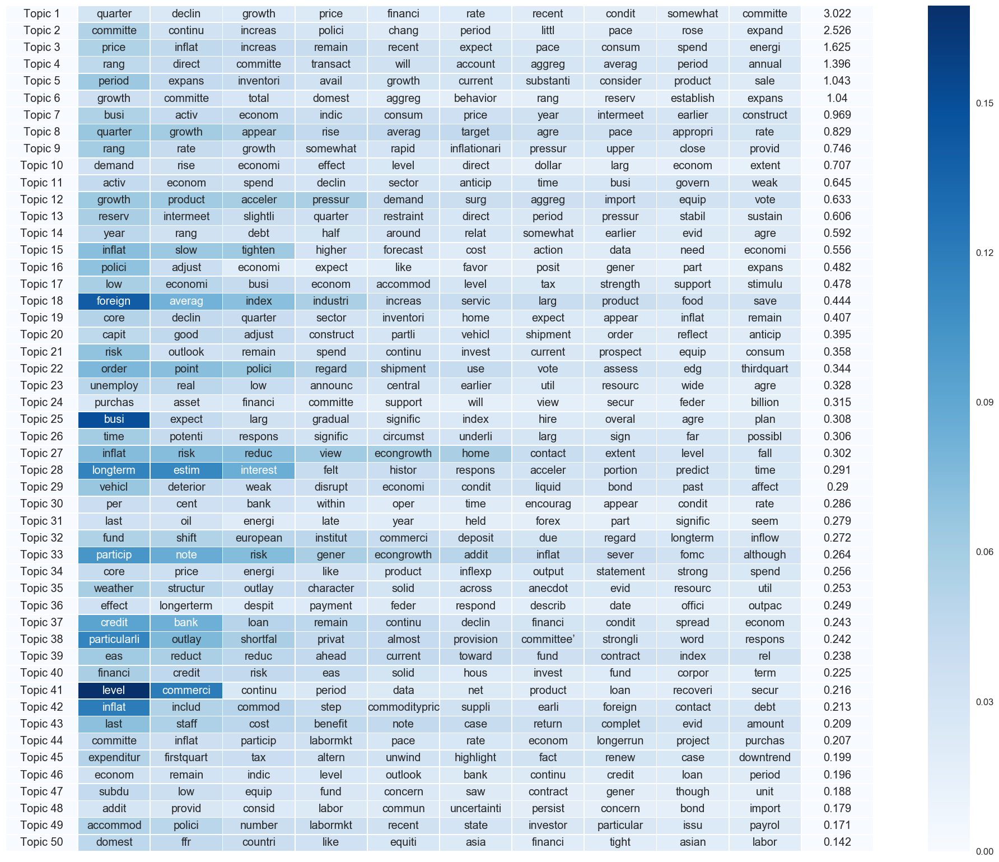

In [51]:
import seaborn as sns

sns.set(font_scale=1.2)
sns.set_style({"savefig.dpi": 100})
# plot it out
ax = sns.heatmap(to_plot_growth, cmap=plt.cm.Blues, linewidths=.5,
                annot=growth_words, fmt = '')
# set the x-axis labels on the top
#ax.xaxis.tick_top()
# rotate the x-axis labels
#plt.xticks(rotation=90)
# get figure (usually obtained via "fig,ax=plt.subplots()" with matplotlib)

fig = ax.get_figure()
fig.set_size_inches(25, 20)
ax.axes.get_xaxis().set_visible(False)
ax.axes.get_yaxis().set_visible(False)

plt.savefig('heattable_growth.png', format='png', dpi=600, transparent=True)

plt.show()

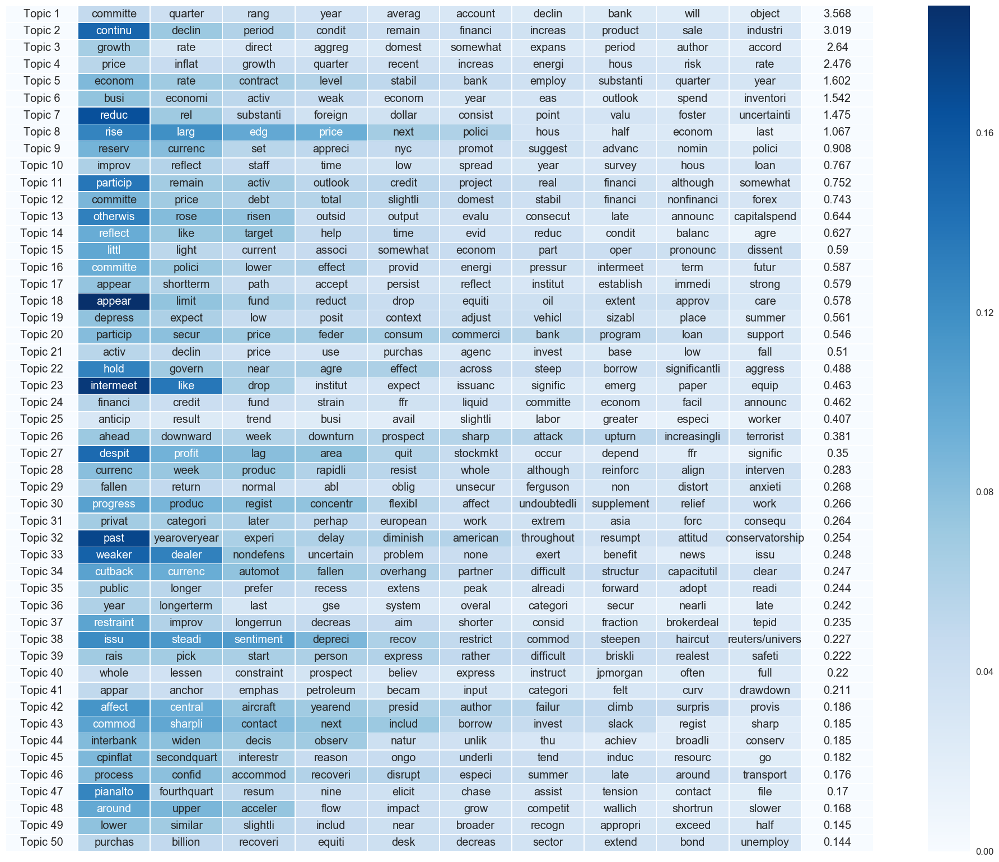

In [52]:
sns.set(font_scale=1.2)
sns.set_style({"savefig.dpi": 100})
# plot it out
ax = sns.heatmap(to_plot_recession, cmap=plt.cm.Blues, linewidths=.5,
                annot=recession_words, fmt = '')
# set the x-axis labels on the top
#ax.xaxis.tick_top()
# rotate the x-axis labels
#plt.xticks(rotation=90)
# get figure (usually obtained via "fig,ax=plt.subplots()" with matplotlib)

fig = ax.get_figure()
fig.set_size_inches(25, 20)
ax.axes.get_xaxis().set_visible(False)
ax.axes.get_yaxis().set_visible(False)

plt.savefig('heattable_recession.png', format='png', dpi=600, transparent=True)

plt.show()